<a href="https://colab.research.google.com/github/Fbanoy/ai_2023/blob/main/1.%20Supervised/Supervised.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Load the packages

In [336]:
!pip install xlsxwriter
!pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [337]:
import pandas as pd
import numpy as np
from openpyxl import Workbook, load_workbook
from google.colab import files


from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score, mean_squared_error, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from scipy.special import comb

from keras.layers import Input, Dense
from keras.models import Model
import umap

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns


# Data functions

In [338]:
def normalized(data: pd.DataFrame) -> pd.DataFrame:
    if not isinstance(data, pd.DataFrame):
        data = pd.DataFrame(data)
    return (data - data.min()) / (data.max() - data.min())

def normalized_labels(labels: np.array) -> np.array:
    unique_labels = np.unique(labels)
    new_labels = np.zeros((labels.shape[0], unique_labels.shape[0]))

    for i, label in enumerate(unique_labels):
        new_labels[labels == label, i] = 1

    return new_labels

def data_loader(data_type: str):
  """Load data for clustering.
  Args:
    data_type (str): the type of data to be loaded, either 'Toy' or 'Real'.
  Returns:
    pd.DataFrame: the data to be clustered.
  """
    # Toy data
  if data_type == 'Toy':
      df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data',
                 header=None,
                 names=['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species'])

      X = df.drop('species', axis=1)
      labels = df['species'].values  # Get the labels as a separate array
      names = X.columns.tolist()  # Get the list of feature names

      data = X.values  # Get the data without labels and convert it to a NumPy array
      return data, names, labels
  # Real data
  elif data_type == 'Real':
      url = "https://raw.githubusercontent.com/Fbanoy/ai_2023/main/1.%20Supervised/heart.csv"
      df = pd.read_csv(url)
      X = df.drop('target', axis=1)
      labels = df['target'].values  # Get the labels as a separate array
      names = X.columns.tolist()  # Get the list of feature names

      data = X.values  # Get the data without labels and convert it to a NumPy array
      return data, names, labels
  else:
      print('No data for that input, the toy data will be loaded instead')
  return data_loader('Toy')

In [339]:
data_normal, features, labels = data_loader('Real')
data_normal=normalized(data_normal)

plot_label=pd.DataFrame(labels)
plot_label.columns=['label']

In [340]:
plot_data_norm=pd.concat([pd.DataFrame(data_normal), plot_label], axis=1)


In [341]:
plot_data_norm

,0,1,2,3,4,5,6,7,8,9,10,11,12,label
0,0.479167,1.0,0.000000,0.292453,0.196347,0.0,0.5,0.740458,0.0,0.161290,1.0,0.50,1.000000,0
1,0.500000,1.0,0.000000,0.433962,0.175799,1.0,0.0,0.641221,1.0,0.500000,0.0,0.00,1.000000,0
2,0.854167,1.0,0.000000,0.481132,0.109589,0.0,0.5,0.412214,1.0,0.419355,0.0,0.00,1.000000,0
3,0.666667,1.0,0.000000,0.509434,0.175799,0.0,0.5,0.687023,0.0,0.000000,1.0,0.25,1.000000,0
4,0.687500,0.0,0.000000,0.415094,0.383562,1.0,0.5,0.267176,0.0,0.306452,0.5,0.75,0.666667,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,0.625000,1.0,0.333333,0.433962,0.216895,0.0,0.5,0.709924,1.0,0.000000,1.0,0.00,0.666667,1
1021,0.645833,1.0,0.000000,0.292453,0.301370,0.0,0.0,0.534351,1.0,0.451613,0.5,0.25,1.000000,0
1022,0.375000,1.0,0.000000,0.150943,0.340183,0.0,0.0,0.358779,1.0,0.161290,0.5,0.25,0.666667,0
1023,0.437500,0.0,0.000000,0.150943,0.292237,0.0,0.0,0.671756,0.0,0.000000,1.0,0.00,0.666667,1


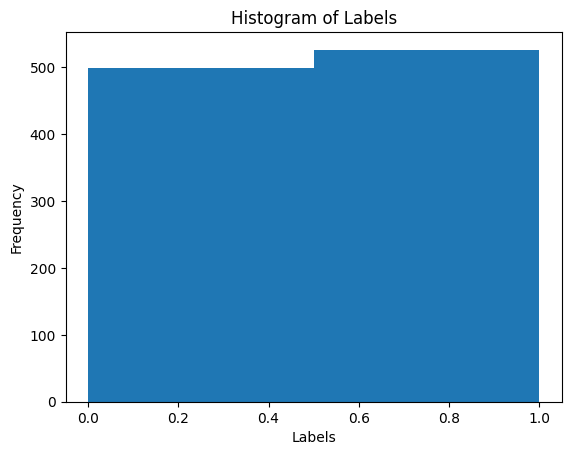

In [342]:
plt.hist(labels_normal, bins=2)
plt.xlabel('Labels')
plt.ylabel('Frequency')
plt.title('Histogram of Labels')
plt.show()

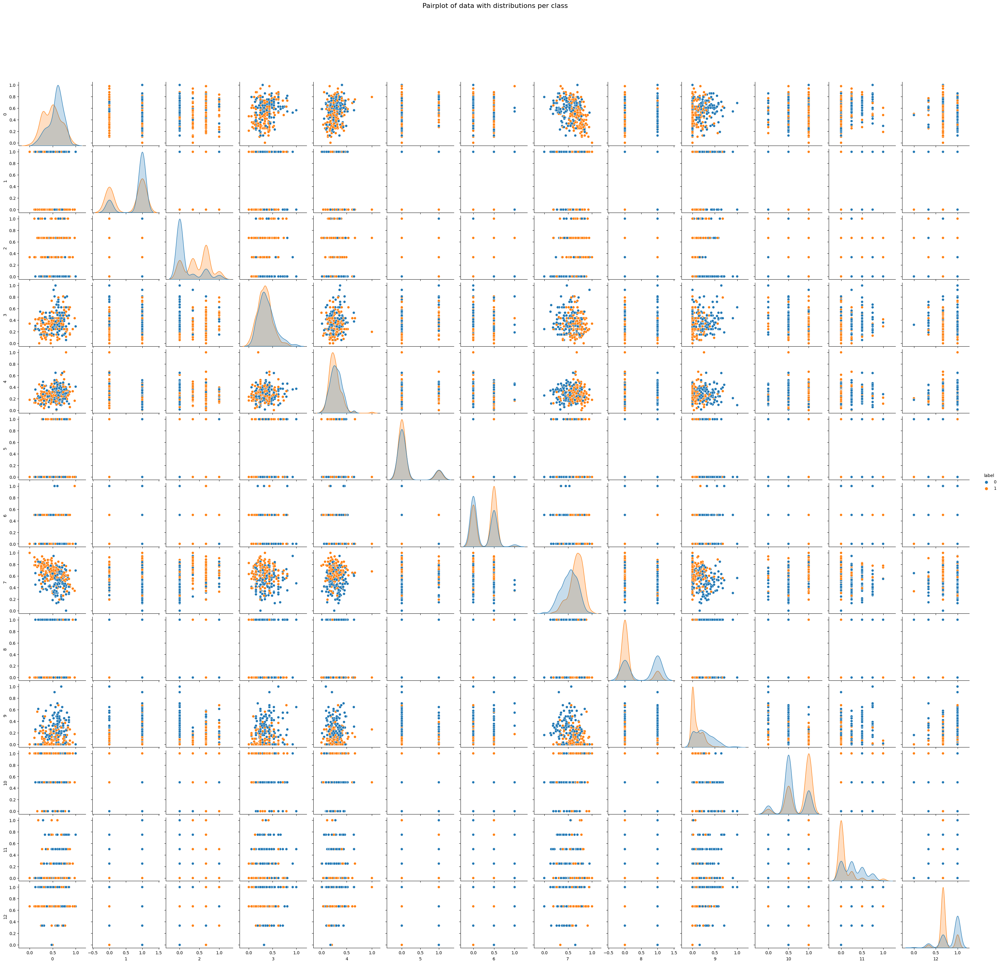

In [343]:
# Distribution of features

ax = sns.pairplot(plot_data_norm, hue="label");
ax.fig.suptitle("Pairplot of data with distributions per class", size=16);
ax.figure.subplots_adjust(top=.9)

# Increases dimension by auto encoder

In [344]:
# Select the number of dimensions
num_dimensions = 14

# Create a copy of the original data
X = data_normal.copy()

# Create the layers of the autoencoder
input_layer = Input(shape=(X.shape[1],))
encoded = Dense(num_dimensions, activation='sigmoid')(input_layer)
decoded = Dense(X.shape[1], activation='sigmoid')(encoded)
autoencoder = Model(input_layer, decoded)

# Compile the autoencoder, choose an optimizer and loss function
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

# Split data into train and test with ratios 70/20
X1, X2, Y1, Y2 = train_test_split(X, X, test_size=0.3, random_state=0)

# Fit the autoencoder
autoencoder.fit(X1, Y1,
                epochs=1000,
                batch_size=300,
                shuffle=True,
                verbose = False,
                validation_data=(X2, Y2))

# Create the encoding model
encoder = Model(input_layer, encoded)

# Actually encode the data
data_high = encoder.predict(X)

33/33 [==============================] - 0s 2ms/step


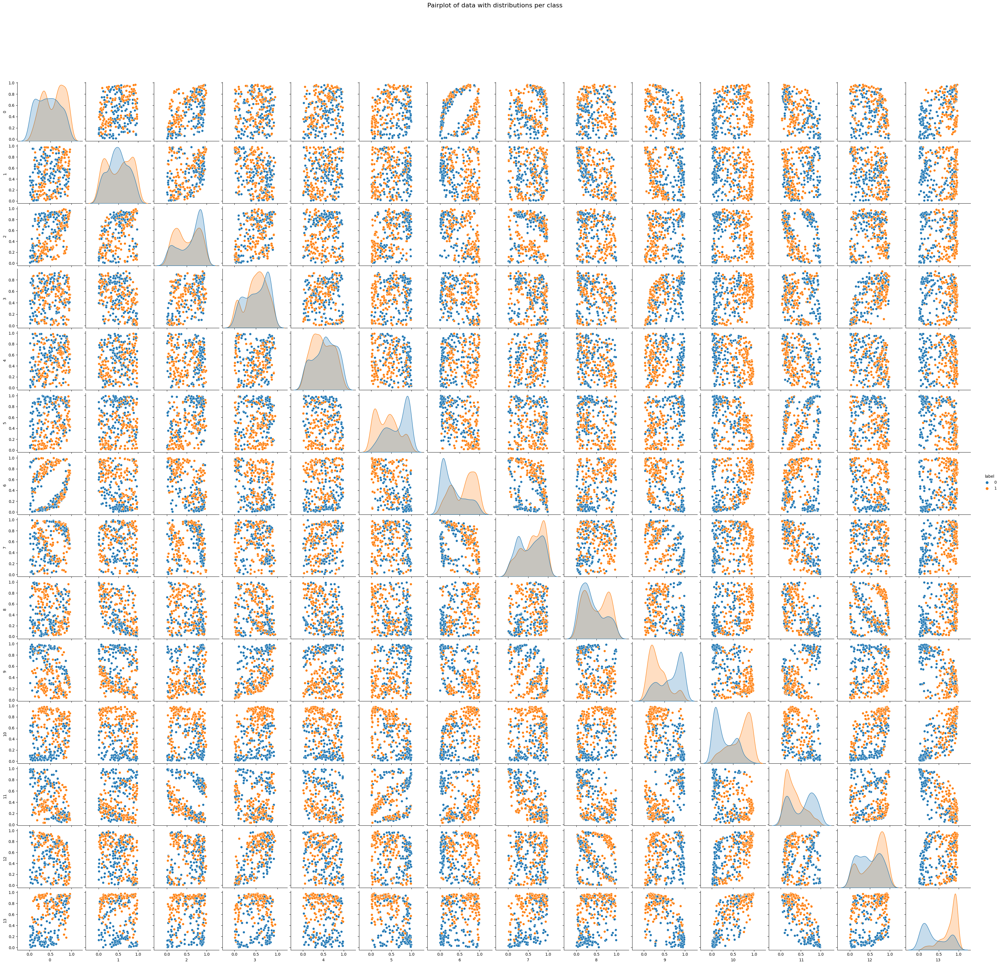

In [345]:
plot_data_high=pd.concat([pd.DataFrame(data_high), plot_label], axis=1)

# Distribution of features

ax = sns.pairplot(plot_data_high, hue="label");
ax.fig.suptitle("Pairplot of data with distributions per class", size=16);
ax.figure.subplots_adjust(top=.9)

# Lowers dimension by UMAP

In [346]:
fit = umap.UMAP(metric='euclidean',
                n_components=7,
                random_state=0,
                n_neighbors=5,
                min_dist=0.3)
data_low = fit.fit_transform(data_normal)

# normalize the data to 0 1
data_low = normalized(data_low)

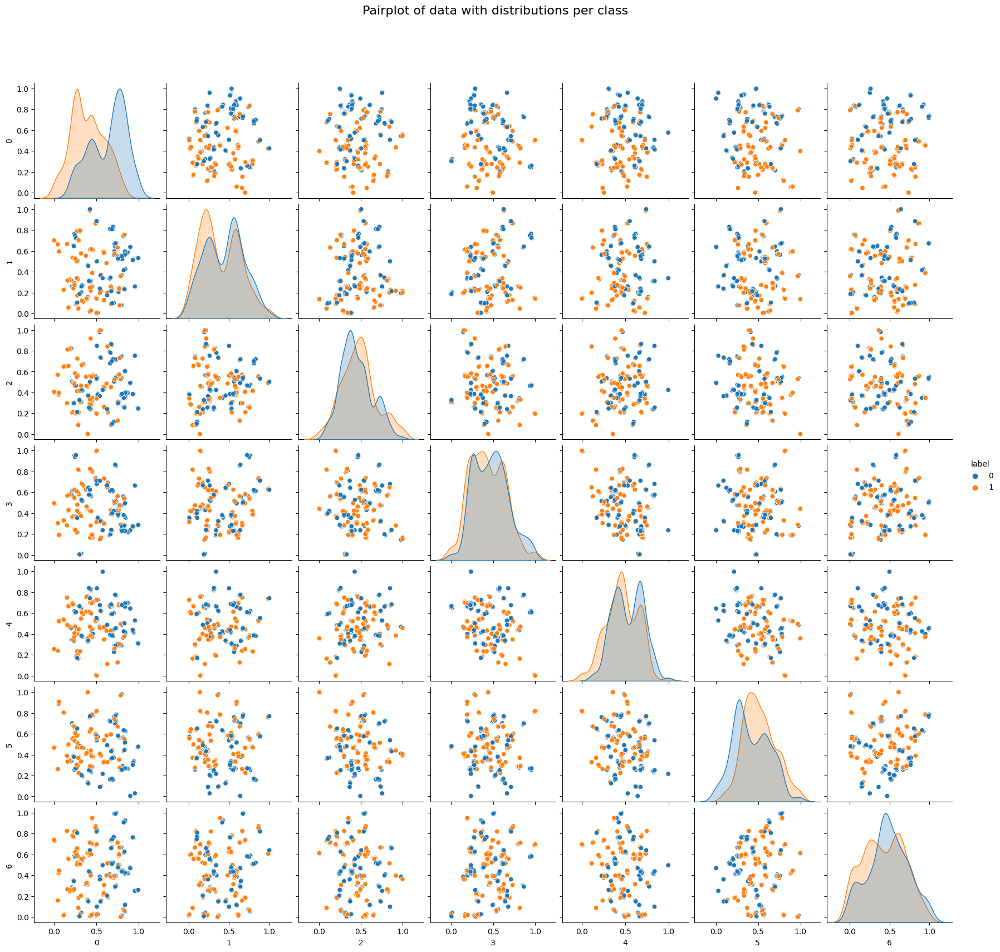

In [347]:
plot_data_low=pd.concat([pd.DataFrame(data_low), plot_label], axis=1)

# Distribution of features

ax = sns.pairplot(plot_data_low, hue="label");
ax.fig.suptitle("Pairplot of data with distributions per class", size=16);
ax.figure.subplots_adjust(top=.9)

# VC

In [348]:
def get_models_name(model):
  models_name = str(type(model)).split(".")[-1][:-2]

  if models_name == 'SVC':
    models_name =  str(model.kernel).title() + models_name

  return models_name


def vc_dimension(model, features):
  d = features.shape[1]
  models_name = get_models_name(model)

  if models_name in ['LogisticRegression', 'lin', 'logistic', 'LinearSVC']:
    vc = d + 1

  elif models_name in ['DecisionTreeClassifier', 'trees', 'tree']:
    n = model.tree_.node_count
    vc = n * np.log(n*d)

  elif models_name in ['poly', 'PolySVC']:
    p = model.degree
    vc = comb(d + p - 1, p, exact=True)

  elif models_name in ['rbf', 'RbfSVC']:
    vc = np.inf

  return vc

def get_params_number(model):
  models_name = get_models_name(model)

  if models_name in ['LogisticRegression', 'lin', 'logistic']:
    num_parameters = len(model.coef_[0])

  elif models_name in ['DecisionTreeClassifier', 'trees', 'tree']:
    num_parameters = model.tree_.node_count
  
  elif models_name in 'LinearSVC':
    num_parameters = sum(model.coef_.shape[1] for coef in model.coef_)
  elif models_name in ['poly', 'PolySVC', 'rbf', 'RbfSVC']:
    num_parameters = sum(model.n_support_)

  return num_parameters

# Model prediction

In [349]:
def fit_predict_test(model, X_train: np.array, y_train: np.array,
                     X_test: np.array, y_test: np.array) -> dict:
    models_name = get_models_name(model)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    bias2 = np.power(np.mean(y_test) - np.mean(y_pred), 2)
    variance = np.var(y_test - y_pred)

    accuracy = accuracy_score(y_test, y_pred)
    confusion = confusion_matrix(y_test, y_pred)
    tp, tn, fp, fn = confusion[0, 0], np.sum(confusion[1:3, 1:3]), np.sum(confusion[0, 1:3]), np.sum(confusion[1:3, 0])

    f1 = f1_score(y_test, y_pred, average='macro')

    vc = vc_dimension(model, X_train)
    num_params = get_params_number(model)

    result = {
        "model": models_name,
        "vc": vc,
        "num_params": num_params,
        "squared_bias": bias2,
        "variance": variance,
        "accuracy": accuracy,
        "tn": tn,
        "fp": fp,
        "fn": fn,
        "tp": tp,
        "f1": f1
    }

    return result


def logistic_reg(X_train: np.array, y_train: np.array, X_test: np.array, y_test: np.array) -> dict:
    model = LogisticRegression()
    return fit_predict_test(model, X_train, y_train, X_test, y_test)


def linear_reg(X_train: np.array, y_train: np.array, X_test: np.array, y_test: np.array) -> dict:
    model = LinearRegression()
    return fit_predict_test(model, X_train, normalized_labels(y_train), X_test, normalized_labels(y_test))


def decision_tree(X_train: np.array, y_train: np.array, X_test: np.array, y_test: np.array) -> dict:
    model = DecisionTreeClassifier()
    return fit_predict_test(model, X_train, y_train, X_test, y_test)


def svm(X_train: np.array, y_train: np.array, X_test: np.array, y_test: np.array, kernel: str = 'rbf') -> dict:
    if kernel in ['lineal', 'linear', 'lin']:
        model = LinearSVC()
    elif kernel in ['poly', 'rbf']:
        model = SVC(kernel=kernel)
    else:
        raise ValueError("Invalid data_type.")

    return fit_predict_test(model, X_train, y_train, X_test, y_test)

In [350]:
def get_required_samples(vc: float, epsilon: float, delta: float) -> int:
  return np.ceil(1/epsilon * (vc + np.log(1/delta)))

def get_result(X_train: np.array, y_train: np.array,
               X_test: np.array, y_test: np.array,
               method: str, epsilon, delta):
  if method=='logistic':
    result = logistic_reg(X_train, y_train, X_test, y_test)
  elif method=='tree':
    result = decision_tree(X_train, y_train, X_test, y_test)
  elif method in ['lin', 'poly', 'rbf']:
    result = svm(X_train, y_train, X_test, y_test, method)
  else:
    raise ValueError("Invalid method.")

  result['required_samples'] = get_required_samples(result['vc'], epsilon, delta)
  result['generalized_error'] = epsilon
  result['training_error'] = delta
  
  return pd.DataFrame([result])

In [351]:
data_names=['data_normal', 'data_low', 'data_high']
data_sets=[data_normal, data_low, data_high]

In [352]:
len(data_high)

1025

In [353]:
methods = ['logistic', 'tree', 'lin','poly', 'rbf']
generalized_errors = [0.1, 0.2, 0.5]
train_errors = [0.1, 0.2, 0.5] # Se escoge de manera arbitraria.


for data_set, data_name in zip(data_sets, data_names):
    X_train, X_test, y_train, y_test = train_test_split(
        data_set, labels, test_size=0.2, random_state=101)

    dfs = [get_result(X_train, y_train, X_test, y_test, method, epsilon, delta)
            for method in methods for epsilon, delta in zip(generalized_errors, train_errors)]
    df = pd.concat(dfs, ignore_index=True)
    df.to_excel(f"{data_name}.xlsx")